$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 6: YOLO - Objects Detection
<a id=part6></a>

In this part we will use an object detection architecture called YOLO (You only look once) to detect objects in images. We'll use an already trained model weights (v5) found here: https://github.com/ultralytics/yolov5

In [1]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the YOLO model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
model.to(device)
# Images
img1 = 'imgs/DolphinsInTheSky.jpg'  
img2 = 'imgs/cat-shiba-inu-2.jpg' 

Using cache found in C:\Users\tomer/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-1-11 Python-3.8.12 torch-1.10.1 CUDA:0 (NVIDIA GeForce RTX 3080, 10240MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


## Inference with YOLO
<a id=part6_1></a>

You are provided with 2 images (img1 and img2).
**TODO**:
1. Detect objects using the YOLOv5 model for these 2 images.
2. Print the inference output with bounding boxes.
3. Look at the inference results and answer the question below.


image 1/1: 183x275 2 persons, 1 surfboard
Speed: 11.0ms pre-process, 11.0ms inference, 207.3ms NMS per image at shape (1, 3, 448, 640)
image 1/1: 750x750 2 cats, 1 dog
Speed: 8.0ms pre-process, 10.0ms inference, 57.8ms NMS per image at shape (1, 3, 640, 640)


Results for img1 (DolphinsInTheSky):

Results for img2 (cat-shiba-inu-2):


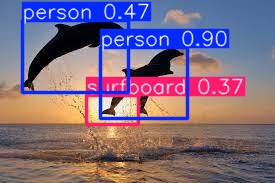

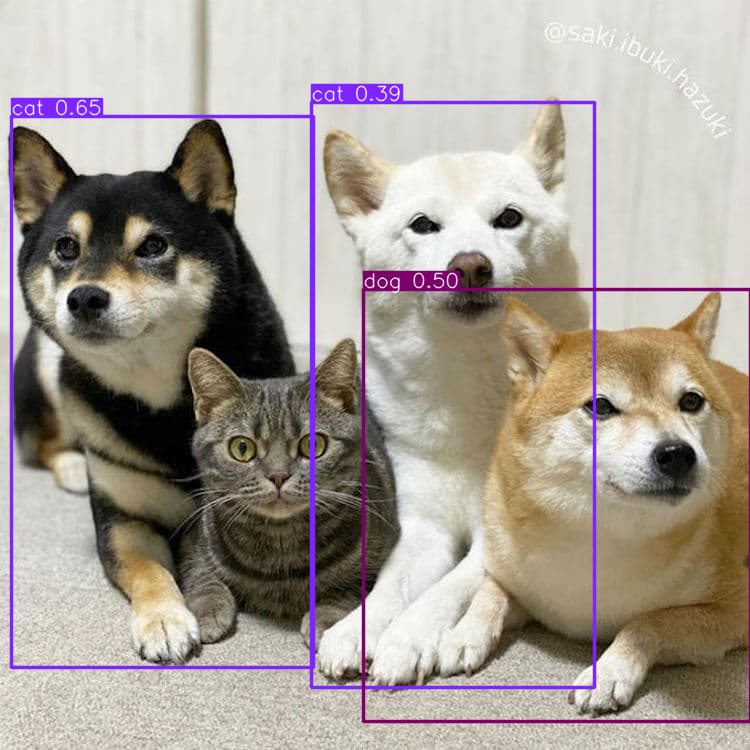

In [2]:
#Insert the inference code here.
with torch.no_grad():
    results1 = model(img1)
    results2 = model(img2)

# Print results with bounding boxes for each image
print("Results for img1 (DolphinsInTheSky):")
results1.print()  # Prints detected objects and their confidence scores

print("\nResults for img2 (cat-shiba-inu-2):")
results2.print()

# Show images with bounding boxes
results1.show()
results2.show()

    
    


### Question 1

Analyze the inference results of the 2 images. 
1. How well did the model detect the objects in the pictures? with what confidance?
2. What can possibly be the reason for the model failures? suggest methods to resolve that issue.
3. recall that we learned how to fool a model by adverserial attack (PGD), describe how you would attack an Object Detection model (such as YOLO).

In [3]:

from cs236781.answers import display_answer
import hw2.answers
display_answer(hw2.answers.part6_q1)



**Your answer:**
Q1

1. 

The model performance was poor. The model did misclassifications such as identifying dolphins as persons and failed to differentiate between dogs and cats. Also the confidence was relatively low in most of the classifications.

2.

Firstly the yolo5s is trained on the COCO dataset, which has predefined classe.
COCO does not include a specific class for dolphins, so the model tries to match dolphins to the closest available class, often person due to the similarity in shape. also yolov5s is a lightweight version designed for speed, which sacrifices some accuracy. Differentiating between dogs and cats can be challenging for models trained on COCO, especially in unusual contexts, poses, or lighting.

If we are not constrained by hardware or inference time, we can use larger YOLOv5 models. These models are more accurate but require more computational resources. We can also clone the model and train it ourselves with a specialized labeled dataset that includes classes like dolphins, dogs, and cats in various positions and lighting conditions.

3.

To attack an object detection model like YOLO using PGD, the goal is to generate small perturbations in the input image that mislead the model's predictions. YOLO relies on both classification and bounding box predictions. In PGD, the process starts by taking a copy of the original image, then iteratively adjusting it using the gradient of the loss function, which increases the model's error. The perturbation is constrained to avoid noticeable changes to the image while causing incorrect predictions.

The attack targets both the classification (misclassifying objects) and localization (distorting bounding boxes or missing objects). After several iterations, the perturbations are refined to maximize the model's failure in detecting or correctly classifying objects. The effectiveness of the attack is evaluated by checking whether the model misclassifies, fails to detect, or inaccurately locates objects in the image.




## Creative Detection Failures

<a id=part6_2></a>

Object detection pitfalls could be, for example: **occlusion** - when the objects are partially occlude, and thus missing important features, **model bias** - when a model learn some bias about an object, it could recognize it as something else in a different setup, and many others like **Deformation**, **Illumination conditions**, **Cluttered** or **textured background and blurring** due to moving objects.

**TODO**: Take pictures and that demonstrates 3 of the above object detection pitfalls, run inference and analyze the results.

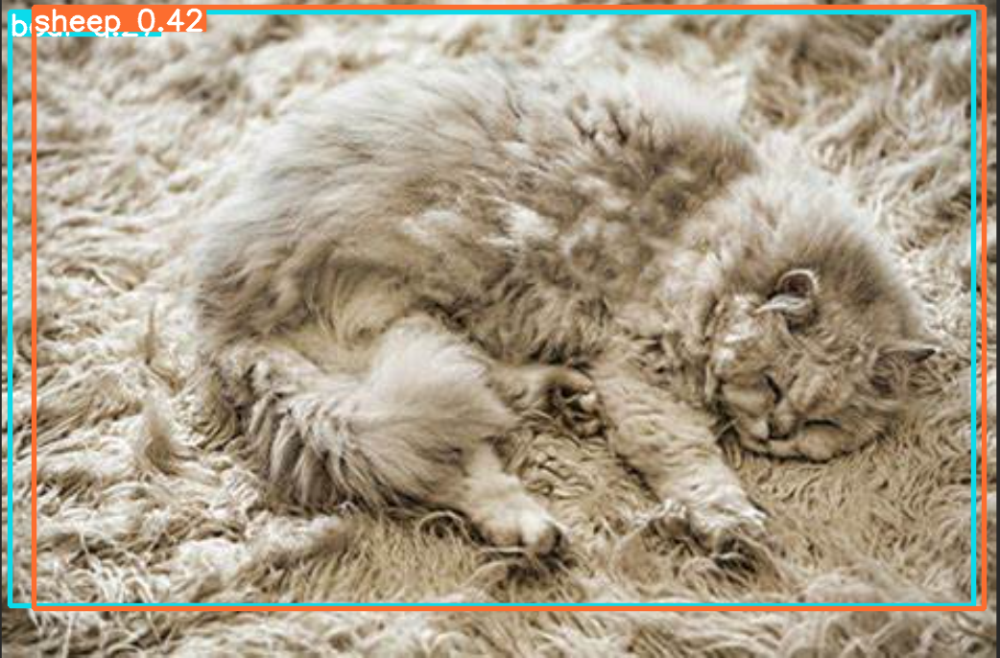

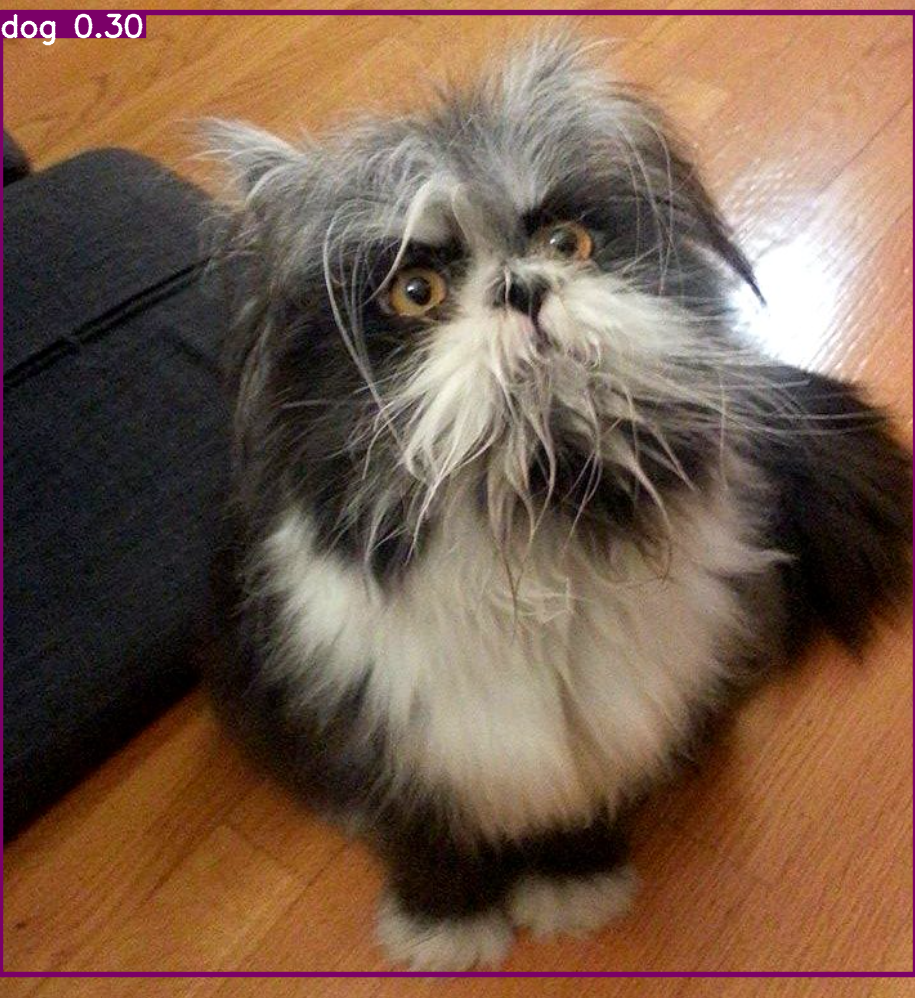

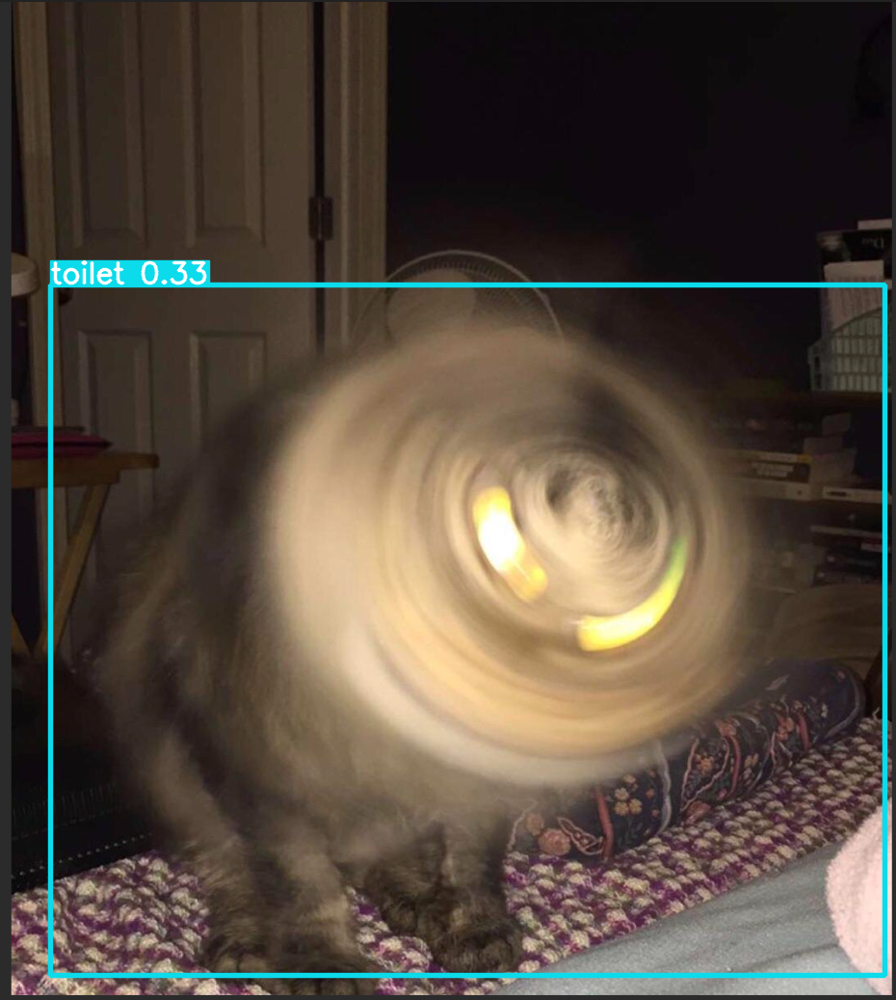

In [4]:
#Insert the inference code here.
# Images
img1 = 'imgs/camu_cat.png'  
img2 = 'imgs/cat_that_looks_like_dog.PNG' 
img3 = 'imgs/blured_cat.PNG' 
with torch.no_grad():
    results1 = model(img1)
    results2 = model(img2)
    results3 = model(img3)


# Show images with bounding boxes
results1.show()
results2.show()
results3.show()

### Question 3

Analyize the results of the inference. 
1. How well did the model detect the objects in the pictures? explain.


In [5]:
display_answer(hw2.answers.part6_q3)



**Your answer:**


The model did terrible.
Most humans can recognize that these pictures are of cats.(maybe except the third image).
The model has mistaken the cat in the first pictured to a sheep because of fur and the white carpet.
It misclassified the cat to a dog, because it really resembles a dog but you can clearly see cat features.
Somehow it misclassified the cat in the third picture to a toilet... probably because of the blur.


## Bonus 
<a id=part6_3></a>

Try improving the model performance over poorly recognized images by changing them. 
Describe the manipulations you did to the pictures.

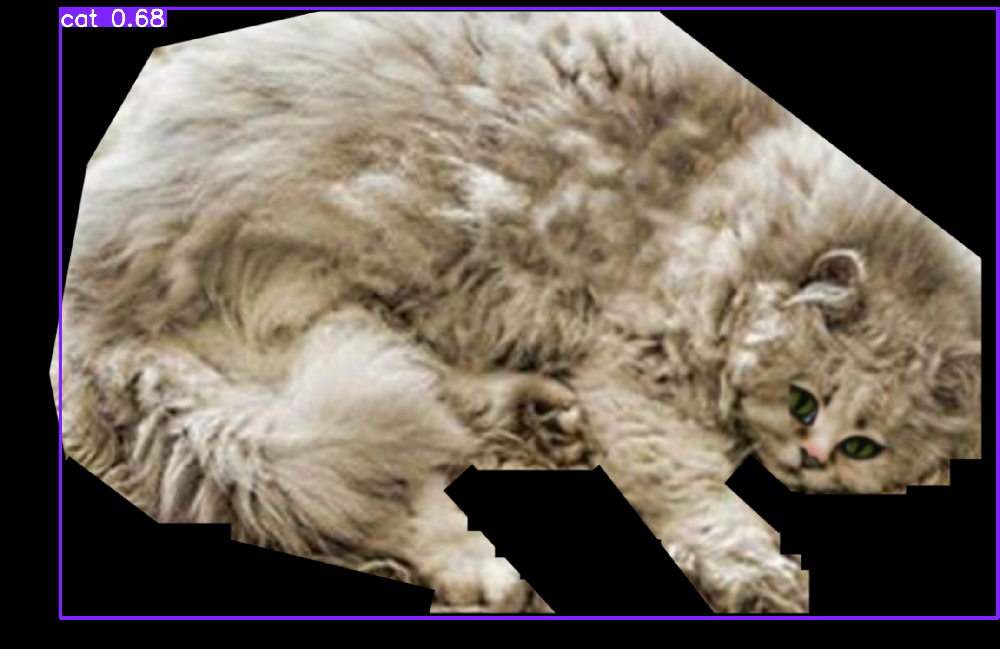

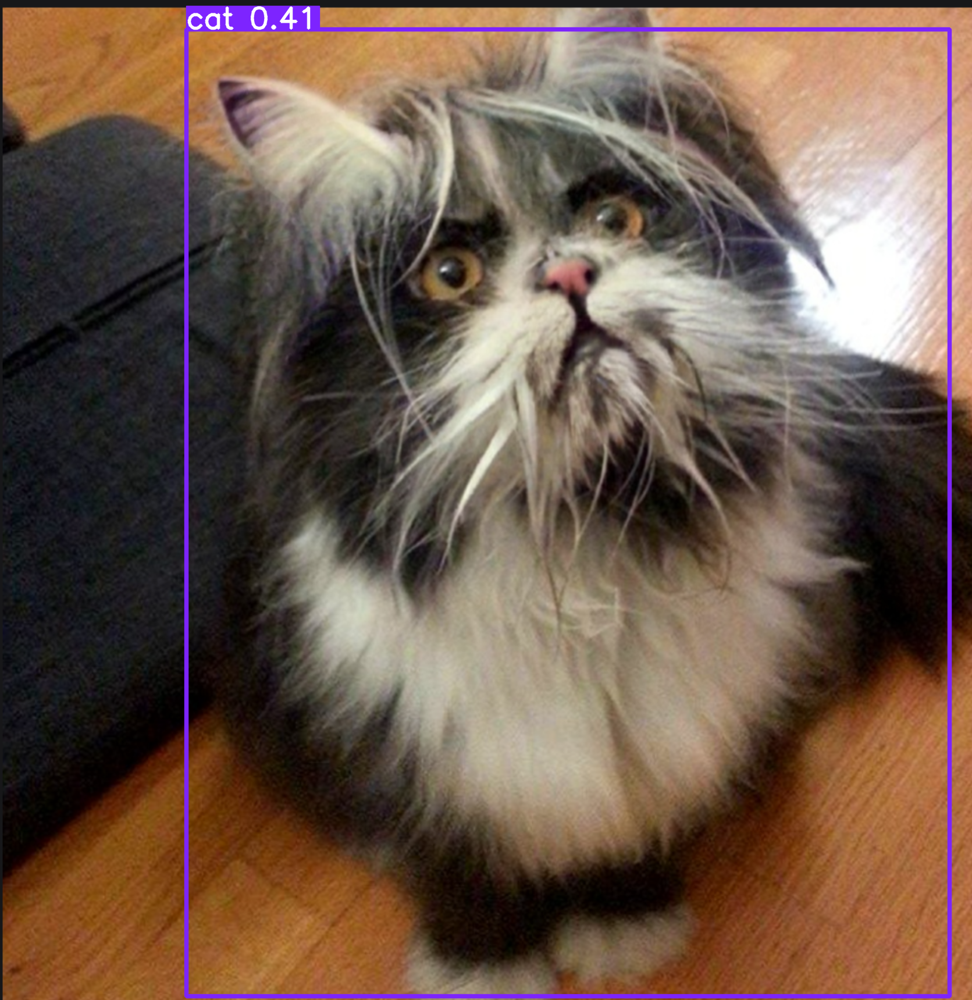

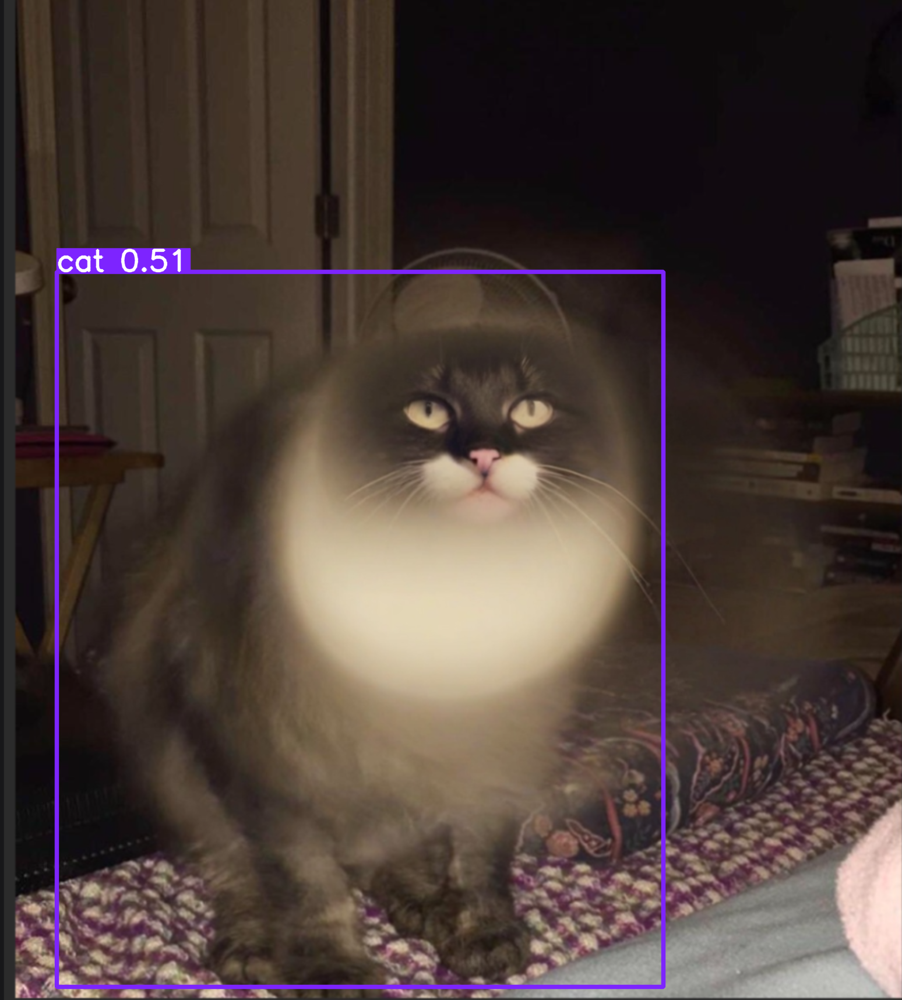

In [6]:
img1 = 'imgs/camu_cat_2.png'  
img2 = 'imgs/cat_that_looks_like_dog_2.PNG' 
img3 = 'imgs/blured_cat_2.PNG' 
with torch.no_grad():
    results1 = model(img1)
    results2 = model(img2)
    results3 = model(img3)


# Show images with bounding boxes
results1.show()
results2.show()
results3.show()

In [9]:
display_answer(hw2.answers.part6_bonus)



**Your answer:**

1.

By removing the background and adding distinct features, like cat eyes, we effectively made the cat more recognizable. The absence of a distracting or camouflaging background allowed the model to focus solely on the key features of the cat, improving recognition accuracy.

2.

We changed the cat nose and ears to make it resemble a cat better.


3.

we added a cat head and removed the blur a litle bit.


This changes made the model recognize the cat correctly.

